We will build momentum strategy, mean reversion strategy, and machine learning strategy to invest S&P 500 from November 2003 to October 2022 to make more profit than just investing S&P500 without any strategy. Our starting capital is $500,000. Then we also calculate other numerical ratios such as Sharpe Ratio, compound annual growth rate, and maximum drawdown to compare the performance of strategies. Finally, we select the top 3 strategies to join the class competitions. 

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas_datareader.data as web
import yfinance as yf
import plotly.graph_objs as go
import datetime as dt
from pandas_datareader import data as pdr
import seaborn as sns
import quantstats as qs

In [2]:
np.set_printoptions(precision = 3)
plt.style.use("ggplot")
mpl.rcParams["axes.grid"] = True
mpl.rcParams["grid.color"] = "grey"
mpl.rcParams["grid.alpha"] = 0.25
mpl.rcParams["axes.facecolor"] = "white"
mpl.rcParams["legend.fontsize"] = 14

### Load Data

In [3]:
capital = 500000
start = dt.date(2000, 11, 1)
end = dt.date(2022, 10, 31)
data = yf.download("^GSPC", start=start, end=end)

[*********************100%***********************]  1 of 1 completed


### Perfomarce Ratio

In [4]:
def sharpe_ratio(ts_returns, periods_per_year = 252):
    n_years = ts_returns.shape[0]/periods_per_year
    annualized_return = np.exp(ts_returns.sum() / n_years)-1
    annualized_vol = ts_returns.std() * np.sqrt(periods_per_year)
    annualized_sharpe = annualized_return / annualized_vol
    return annualized_sharpe

def CAGR(total_amount):
    D = (total_amount.index[-1] - total_amount.index[0]).days
    CAGR = (((total_amount.iloc[-1]) / (total_amount.iloc[1])) ** (365.0/D)) - 1
    return CAGR

def max_drowdown(total_amount):
    cum_max = total_amount.cummax()
    drawdown = (cum_max - total_amount)/cum_max
    return drawdown.max()

def max_drowdown_plot(total_amount):
    cum_max = total_amount.cummax()
    drawdown = (total_amount-cum_max)/cum_max
    drawdown=pd.DataFrame(drawdown,index=total_amount.index)
    drawdown.plot(figsize=(16,10))

In [5]:
sharpe_list = []
CAGR_list = []
max_drawdown_list = []
account = []

### Benchmark 

In [6]:
SP500 = data.copy().loc['2003/11':,]
SP500['returns'] = np.log(SP500['Adj Close']/SP500['Adj Close'].shift(1))
SP500.fillna(0,inplace=True)
SP500['cum_returns'] = SP500['returns'].cumsum().apply(np.exp)
benchmark_total = SP500['cum_returns']*capital

In [7]:
print("The Sharpe Ratio is {:.4f}".format(sharpe_ratio(SP500['returns'])))
print("The compound annual growth rate is {:.4f}%".format(CAGR(benchmark_total)*100))
print("The maximum drawdown rate is {:.4f}%".format(max_drowdown(benchmark_total)*100))
print("{:.4f} is left on your account".format(benchmark_total[-1]))

The Sharpe Ratio is 0.3680
The compound annual growth rate is 7.1355%
The maximum drawdown rate is 56.7754%
1841825.4550 is left on your account


In [8]:
sharpe_list.append(['Benchmark', sharpe_ratio(SP500['returns'])])
CAGR_list.append(['Benchmark', CAGR(benchmark_total)])
max_drawdown_list.append(['Benchmark', max_drowdown(benchmark_total)])
account.append(['Benchmark', benchmark_total[-1]])

In [9]:
fig = [go.Scatter(x = benchmark_total.cummax().index, y =benchmark_total.cummax().values, name = "Max Capital"),
                   go.Scatter(x = benchmark_total.index, y = benchmark_total.values, name = "Total Capital")]
layout = dict(title='Our Account',showlegend= True)
f = dict(data = fig,layout = layout)
go.Figure(f)

### Mean Reversion 

The main idea of mean Reversion is that asset price volatility and historical returns eventually will revert to the long run mean or average level of the entire dataset. Price tends to go up and down around the mean or average. The strategy focuses on when a security moves too far away from some average. 

### Mean Reversion

### Find Best Parameter

In [10]:
windows_1 = np.array([20,60,120,250])
windows_2 = np.array([5,10,20,60,120,250])
N1 = np.linspace(0.5,3,6)
N2 = np.linspace(0.5,3,6)
results = []
best_cum = 0
W1 = 0
W2 = 0
N_1 = 0
N_2 = 0
for w1 in windows_1:
    for w2 in windows_2:
        if w1>=w2:
            for n1 in N1:
                for n2 in N2:
                    SP500 = data.copy()
                    SP500['EMA'] = SP500['Adj Close'].ewm(span = w1,adjust=False).mean()
                    SP500['std'] = SP500['Adj Close'].ewm(span = w2,adjust=False).std()
                    SP500['dist'] = SP500['Adj Close'] - SP500['EMA']
                    SP500['up'] = SP500['EMA'] + n1 * SP500['std']
                    SP500['down'] = SP500['EMA'] - n2 * SP500['std']
                    SP500 =SP500.loc['2003/11/03':,:]
                    SP500['returns'] = np.log(SP500['Adj Close']/SP500['Adj Close'].shift(1))
                    SP500.fillna(0,inplace=True)
                    SP500['positions'] = np.where((SP500['Adj Close'] < SP500['down']), 1,np.nan)
                    SP500['positions'] = np.where((SP500['Adj Close'] > SP500['up']),-1,SP500['positions'])
                    SP500['positions'] = np.where(SP500['dist'] * SP500['dist'].shift(-1)<0,0,SP500['positions'])
                    SP500['positions'] = SP500['positions'].ffill()
                    SP500['positions'] = SP500['positions'].fillna(0)
                    SP500['stragety'] = SP500['positions'].shift(1) * SP500['returns']
                    SP500.fillna(0,inplace=True)
                    SP500['cum_returns'] = SP500['stragety'].cumsum().apply(np.exp)
                    cum_return = SP500['cum_returns'].iloc[-1]*capital
                    if cum_return > best_cum:
                        best_cum = cum_return
                        W1 = w1
                        W2 = w2
                        N_1 = n1
                        N_2 = n2
                        results.append([w1,w2,n1,n2,best_cum])
                    else:
                        continue
results[-1]

[250, 120, 3.0, 2.0, 705234.061357745]

### Building Stragety

In [10]:
mean_reversion = data.copy()
mean_reversion['returns'] = np.log(mean_reversion['Adj Close']/mean_reversion['Adj Close'].shift(1))
mean_reversion.fillna(0,inplace=True)
mean_reversion['EMA'] = mean_reversion['Adj Close'].ewm(span =250,adjust=False).mean()
mean_reversion['std'] = mean_reversion['Adj Close'].ewm(span = 120,adjust=False).std()
mean_reversion['dist'] = mean_reversion['Adj Close'] - mean_reversion['EMA']
mean_reversion['up'] = mean_reversion['EMA'] + 3 * mean_reversion['std']
mean_reversion['down'] = mean_reversion['EMA'] - 2 * mean_reversion['std']
mean_reversion =mean_reversion.loc['2003/11/03':,:]
mean_reversion['returns'] = np.log(mean_reversion['Adj Close']/mean_reversion['Adj Close'].shift(1))
mean_reversion.fillna(0,inplace=True)
mean_reversion['positions'] = np.where((mean_reversion['Adj Close'] <= mean_reversion['down']), 1,np.nan)
mean_reversion['positions'] = np.where((mean_reversion['Adj Close'] >=mean_reversion['up']),-1,mean_reversion['positions'])
mean_reversion['positions'] = np.where(mean_reversion['dist'] * mean_reversion['dist'].shift(-1)<0,0,mean_reversion['positions'])
mean_reversion['positions'] = mean_reversion['positions'].ffill()
mean_reversion['positions'] = mean_reversion['positions'].fillna(0)
mean_reversion['stragety'] = mean_reversion['positions'].shift(1) * mean_reversion['returns']
mean_reversion.fillna(0,inplace=True)
mean_reversion['cum_returns'] = mean_reversion['stragety'].cumsum().apply(np.exp)
mean_reversion_total = mean_reversion['cum_returns']*capital
mean_reversion['buy_or_sell'] = mean_reversion['positions'].diff()

In [11]:
fig = [go.Scatter(x = mean_reversion.index, y = mean_reversion['Adj Close'], name = "Close"),
                   go.Scatter(x = mean_reversion.loc[mean_reversion.buy_or_sell == 1.0].index, y = mean_reversion['Adj Close'][mean_reversion.buy_or_sell == 1.0], mode='markers',name = "buy"),
                   go.Scatter(x = mean_reversion.loc[mean_reversion.buy_or_sell == -1.0].index, y = mean_reversion['Adj Close'][mean_reversion.buy_or_sell == -1.0], mode='markers',name = "sell"),
                   go.Scatter(x = mean_reversion.index, y = mean_reversion['EMA'], name = "EMA250"),
                   go.Scatter(x = mean_reversion.index, y = mean_reversion['up'], name = "upper bound"),
                   go.Scatter(x = mean_reversion.index, y = mean_reversion['down'], name = "lower bound")
     ]
layout = dict(title='Mean Reversion Stragety')
f = dict(data = fig,layout = layout)
go.Figure(f)

### Result

In [20]:
print("The Sharpe Ratio is {:.4f}".format(sharpe_ratio(mean_reversion['stragety'])))
print("The compound annual growth rate is {:.4f}%".format(CAGR(mean_reversion_total)*100))
print("The maximum drawdown rate is {:.4f}%".format(max_drowdown(mean_reversion_total)*100))
print("{:.4f} is left on your account".format(mean_reversion_total[-1]))

The Sharpe Ratio is 0.1306
The compound annual growth rate is 1.7584%
The maximum drawdown rate is 48.1713%
696275.4089 is left on your account


In [13]:
fig = [go.Scatter(x = mean_reversion_total.cummax().index, y = mean_reversion_total.cummax().values, name = "Max Capital"),
                   go.Scatter(x = mean_reversion_total.index, y = mean_reversion_total.values, name = "Total Capital")]
layout = dict(title='Our Account',showlegend= True)
f = dict(data = fig,layout = layout)
go.Figure(f)

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2003-11-03  2003-11-03
End Period                 2022-10-28  2022-10-28
Risk-Free Rate             0.0%        0.0%
Time in Market             13.0%       100.0%

Cumulative Return          17.14%      430.14%
CAGR﹪                     0.84%       9.18%

Sharpe                     0.13        0.56
Prob. Sharpe Ratio         71.33%      99.2%
Smart Sharpe               0.11        0.46
Sortino                    0.18        0.78
Smart Sortino              0.15        0.64
Sortino/√2                 0.13        0.55
Smart Sortino/√2           0.11        0.45
Omega                      1.07        1.07

Max Drawdown               -52.37%     -55.19%
Longest DD Days            5091        1772
Volatility (ann.)          13.48%      19.15%
R^2                        0.48        0.48
Information Ratio          -0.04       -0.04
Calmar                     0.02      

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2008-08-12,2009-03-09,2022-07-21,5091,-52.374114,-42.007675
2,2008-02-04,2008-03-10,2008-05-01,87,-8.930002,-8.787276
3,2022-10-05,2022-10-12,2022-10-25,20,-5.691650,-5.590432
4,2008-07-02,2008-07-15,2008-08-06,35,-5.524140,-4.477103
5,2022-09-29,2022-09-30,2022-10-04,5,-3.620998,-2.135279


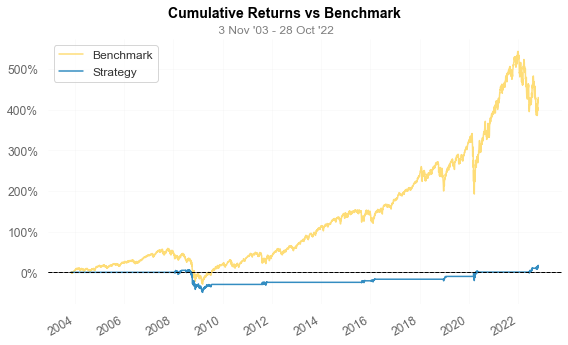

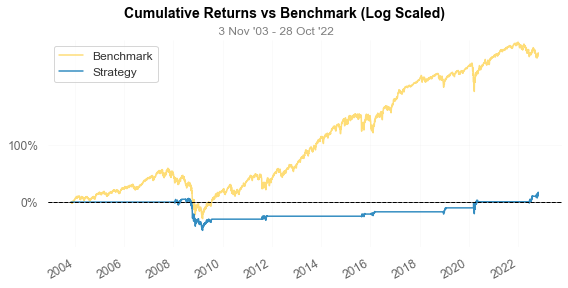

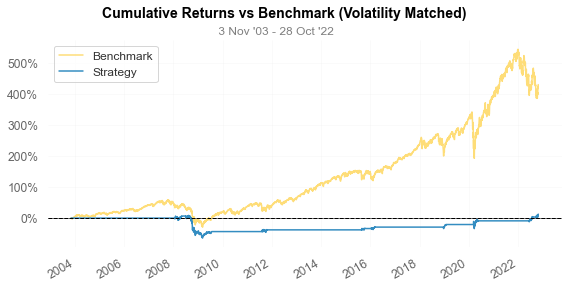

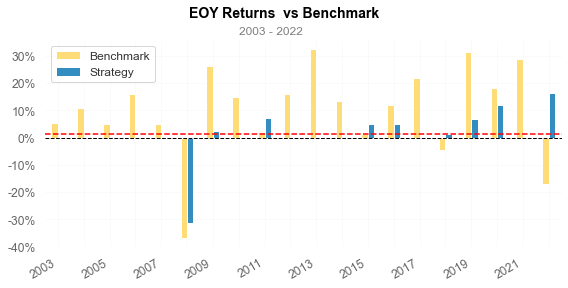

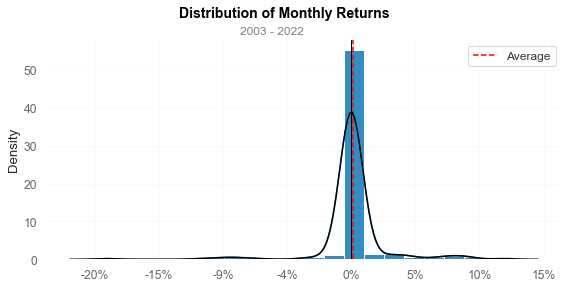

...

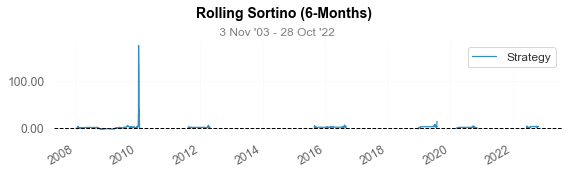

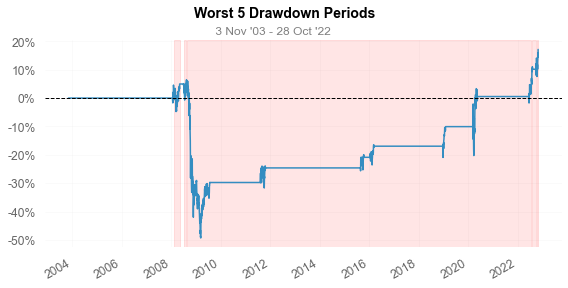

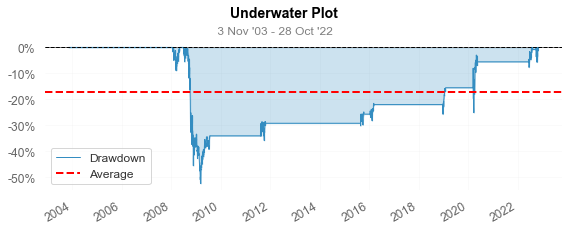

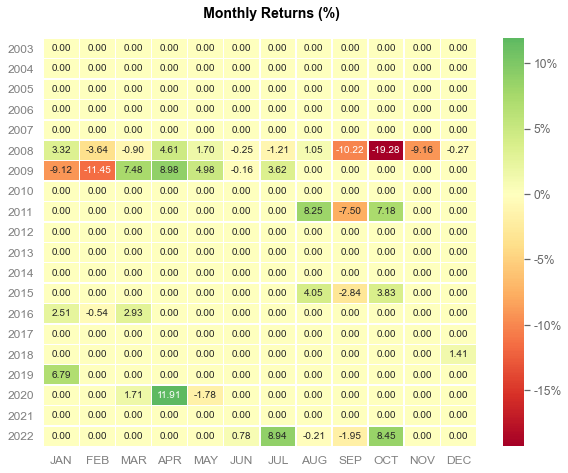

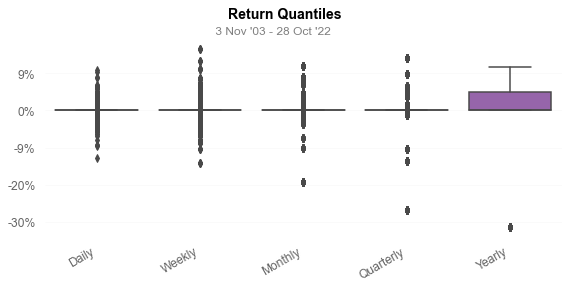

In [18]:
qs.reports.full(mean_reversion['stragety'], "SPY")

In [19]:
qs.reports.html(mean_reversion['stragety'], "SPY", output='mean_reversion.html')

### Momentum

The main idea of momentum strategy is that investors buy securities that are rising and sell them as soon as they show signs of going down. Since we find that SP500 index has an upward trend over the past 20 years, we want to build a momentum strategy to catch the opportunity of this trend and exit the position when the direction of trend changes in a short period of time. 

### Moving Average Cross Stragety

### Find Best Parameter

In [15]:
SHORT = np.array([5,10,20,30,60])
MID = np.array([40,60,90,100,120,250])
LONG = np.array([120,180,200,250,300,400,500])

short = 0
mid = 0 
long = 0 
best_cum =0
results = []

for s in SHORT:
    for m in MID:
        for l in LONG:
            if (l > m) & (m>s):
                SP500 = data.copy()
                SP500['SMA_short'] = SP500["Adj Close"].rolling(s).mean()
                SP500['SMA_mid'] = SP500["Adj Close"].rolling(m).mean()
                SP500['SMA_long'] = SP500["Adj Close"].rolling(l).mean()
                SP500 = SP500.loc['2003/11/03':,:]
                SP500['returns'] = np.log(SP500['Adj Close']/SP500['Adj Close'].shift(1))
                SP500.fillna(0,inplace=True)
                # for long position
                SP500['positions'] = np.where((SP500['SMA_short']>=SP500['SMA_mid'])&
                                              (SP500['SMA_long']==SP500['SMA_long'].rolling(5).max()),1,np.nan)
                SP500['positions'] = np.where((SP500['SMA_short']<=SP500['SMA_mid'])&
                                              (SP500['positions'].shift(1)==1),0,SP500['positions'])
                SP500['positions'] = np.where(((SP500['SMA_long']>=SP500['SMA_mid'])&
                                               (SP500['SMA_long']==SP500['SMA_long'].rolling(5).min())),
                                              -1,SP500['positions'])
                SP500['positions'] = np.where((SP500['SMA_mid']==SP500['SMA_mid'].rolling(5).max())&
                                              (SP500['positions'].shift(1)==-1),
                                              0,SP500['positions'])
                SP500['positions'] = SP500['positions'].ffill()
                SP500['positions'] = SP500['positions'].fillna(0)
                SP500['stragety'] = SP500['positions'].shift(1) * SP500['returns']
                SP500.fillna(0,inplace=True)
                SP500['cum_returns'] = SP500['stragety'].cumsum().apply(np.exp)
                cum_return = SP500['cum_returns'].iloc[-1]*capital
                if cum_return > best_cum:
                    best_cum = cum_return
                    short = s
                    mid = m
                    long = l
                    results.append([short,mid,long,best_cum])
            else:
                continue
results[-1]                

[60, 120, 200, 3702329.5589713873]

### Building Strategy

In [21]:
momentum = data.copy()
momentum['SMA_short'] = momentum["Adj Close"].rolling(60).mean()
momentum['SMA_mid'] = momentum["Adj Close"].rolling(120).mean()
momentum['SMA_long'] = momentum["Adj Close"].rolling(200).mean()
momentum = momentum.loc['2003/11/03':,:]
momentum['returns'] = np.log(momentum['Adj Close']/momentum['Adj Close'].shift(1))
momentum.fillna(0,inplace=True)
momentum['positions'] = np.where((momentum['SMA_short']>momentum['SMA_mid'])&
                                              (momentum['SMA_long']==momentum['SMA_long'].rolling(5).max()),1,np.nan)
momentum['positions'] = np.where((momentum['SMA_short']<=momentum['SMA_mid'])&
                                              (momentum['positions'].shift(1)==1),0,momentum['positions'])
momentum['positions'] = np.where(((momentum['SMA_long']>=momentum['SMA_mid'])&
                                               (momentum['SMA_long']==momentum['SMA_long'].rolling(5).min())),
                                              -1,momentum['positions'])
momentum['positions'] = np.where((momentum['SMA_mid']==momentum['SMA_mid'].rolling(5).max())&
                                              (momentum['positions'].shift(1)==-1),
                                              0,momentum['positions'])
momentum['positions'] = momentum['positions'].ffill()
momentum['positions'] = momentum['positions'].fillna(0)
momentum['stragety'] = momentum['positions'].shift(1) * momentum['returns']
momentum.fillna(0,inplace=True)
momentum['stragety'] = momentum['positions'].shift(1) * momentum['returns']
momentum.fillna(0,inplace=True)
momentum['cum_returns'] = momentum['stragety'].cumsum().apply(np.exp)
momentum_total = momentum['cum_returns']*capital
momentum['buy_or_sell'] = momentum['positions'].diff()

In [22]:
fig = [go.Scatter(x = momentum.index, y = momentum['Adj Close'], name = "Close"),
                   go.Scatter(x = momentum.loc[momentum.buy_or_sell == 1.0].index, y = momentum['Adj Close'][momentum.buy_or_sell == 1.0], mode='markers',name = "buy"),
                   go.Scatter(x = momentum.loc[momentum.buy_or_sell == -1.0].index, y = momentum['Adj Close'][momentum.buy_or_sell == -1.0], mode='markers',name = "sell"),
                   go.Scatter(x = momentum.index, y = momentum['SMA_short'], name = "SMA60"),
                   go.Scatter(x = momentum.index, y = momentum['SMA_mid'], name = "SMA120"),
                   go.Scatter(x = momentum.index, y = momentum['SMA_long'], name = "SMA180"),
                  ]
layout = dict(title='Moment Strategy')
f = dict(data = fig,layout = layout)
go.Figure(f)

### Result

In [27]:
print("The Sharpe Ratio is {:.4f}".format(sharpe_ratio(momentum['stragety'])))
print("The compound annual growth rate is {:.4f}%".format(CAGR(momentum_total )*100))
print("The maximum drawdown rate is {:.4f}%".format(max_drowdown(momentum_total )*100))
print("{:.4f} is left on your account".format(momentum_total [-1]))

The Sharpe Ratio is 0.4660
The compound annual growth rate is 8.4119%
The maximum drawdown rate is 33.9250%
2319198.5054 is left on your account


In [24]:
sharpe_list.append(['Momentum', sharpe_ratio(momentum['stragety'])])
CAGR_list.append(['Momentum', CAGR(momentum_total)])
max_drawdown_list.append(['Momentum', max_drowdown(momentum_total)])
account.append(['Momentum', momentum_total[-1]])

In [25]:
fig = [go.Scatter(x = momentum_total.cummax().index, y =momentum_total.cummax().values, name = "Max Capital"),
                   go.Scatter(x = momentum_total.index, y = momentum_total.values, name = "Total Capital")]
layout = dict(title='Our Account',showlegend= True)
f = dict(data = fig,layout = layout)
go.Figure(f)

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2003-11-03  2003-11-03
End Period                 2022-10-28  2022-10-28
Risk-Free Rate             0.0%        0.0%
Time in Market             86.0%       100.0%

Cumulative Return          239.83%     430.14%
CAGR﹪                     6.65%       9.18%

Sharpe                     0.45        0.56
Prob. Sharpe Ratio         97.36%      99.2%
Smart Sharpe               0.39        0.49
Sortino                    0.63        0.78
Smart Sortino              0.55        0.68
Sortino/√2                 0.45        0.55
Smart Sortino/√2           0.39        0.48
Omega                      1.1         1.1

Max Drawdown               -36.1%      -55.19%
Longest DD Days            1163        1772
Volatility (ann.)          18.08%      19.15%
R^2                        0.0         0.0
Information Ratio          -0.01       -0.01
Calmar                     0.18        

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-02-20,2020-03-23,2020-09-02,195,-36.102640,-31.542606
2,2009-03-10,2009-06-29,2011-10-03,937,-30.320998,-29.790302
3,2011-10-04,2012-11-15,2013-11-14,772,-21.884103,-20.652515
4,2022-01-04,2022-08-16,2022-10-28,297,-21.462218,-21.001802
5,2008-11-21,2009-01-06,2009-03-02,101,-20.727316,-20.477306


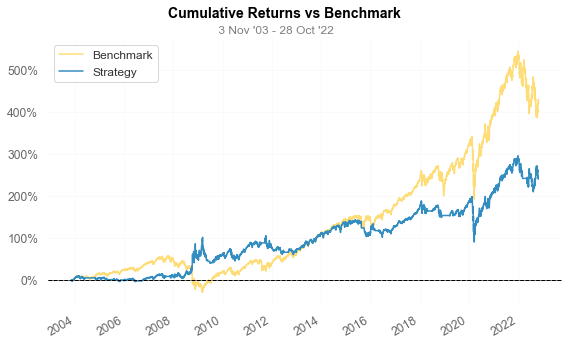

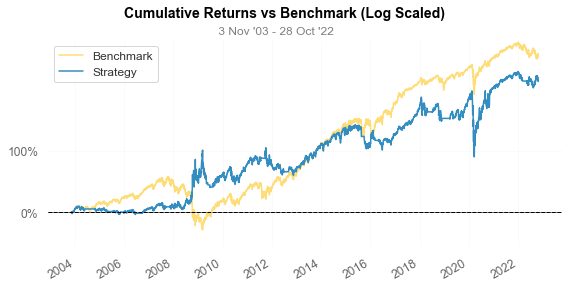

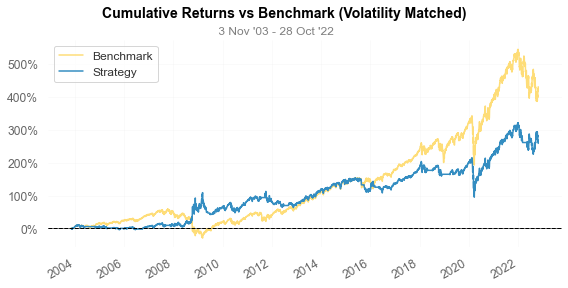

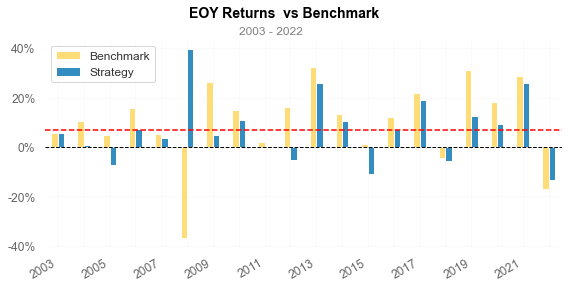

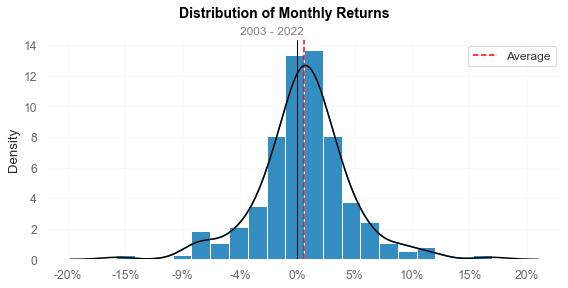

...

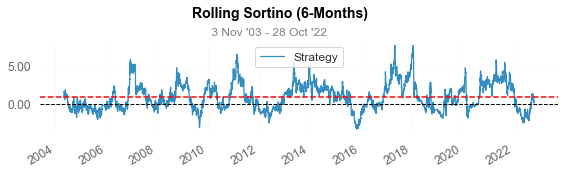

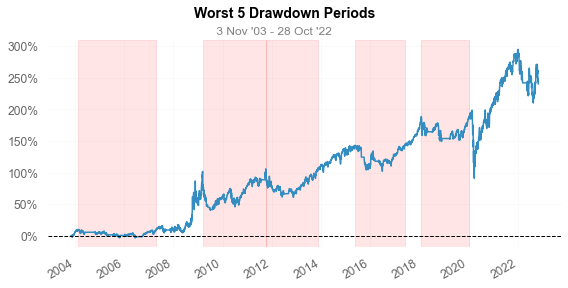

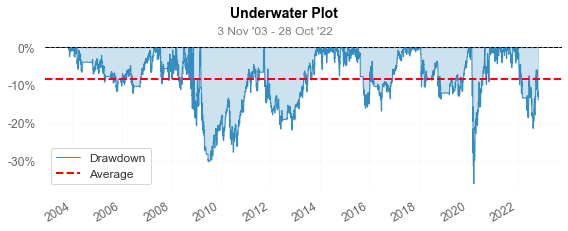

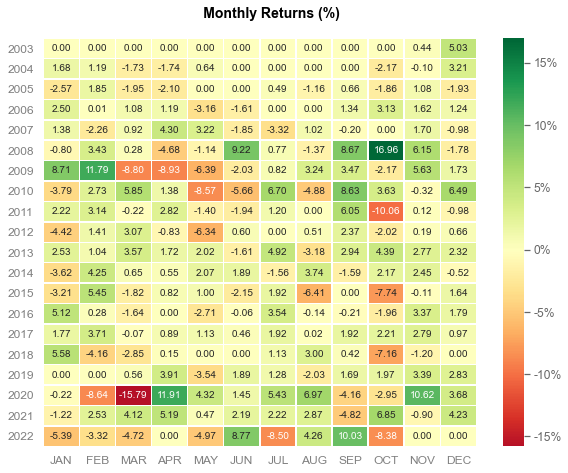

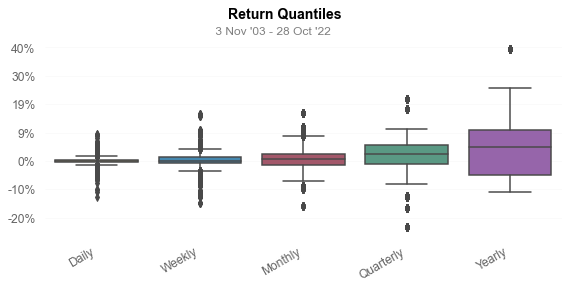

In [28]:
qs.reports.full(momentum['stragety'], "SPY")

In [29]:
qs.reports.html(momentum['stragety'], "SPY", output='mean_reversion.html')

### Machine Learning

In [74]:
from sklearn.preprocessing import StandardScaler
from sklearn import  metrics

In [75]:
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

### Target Value

In [76]:
ML2=data.copy().loc['2003/11/03':,:]

ML2['price'] = (ML2['High'] - ML2['Low'])/ ML2['Adj Close']
ML2_features = ML2[['price','Volume']]
feature_kmeans = np.asarray([np.asarray(ML2['price']),np.asarray(ML2['Volume'])]).T

scaler = StandardScaler().fit(feature_kmeans)
X = pd.DataFrame(scaler.fit_transform(feature_kmeans),
                 columns = ML2_features.columns, 
                 index =ML2_features.index)

In [77]:
K = 3 # the result of 3 clusters is better the that of 2 clusters, and I will combine two clusters
kmeans = KMeans(n_clusters = K,random_state=0,algorithm='elkan').fit(X)
clusters = kmeans.predict(X)

#### Clustering Result

In [78]:
pd.options.plotting.backend = 'plotly'
import plotly.io as pio
pio.templates.default = 'none'

In [79]:
colors = ['red','orange','yellow','green','blue','indigo']

fig = ML2.plot.scatter(x=ML2.index,y='Adj Close',
                          color = [colors[i%len(colors)]for i in clusters])
layout = go.Layout(showlegend= False,
                   plot_bgcolor='white',
                   font_color='black',
                  font_family = 'Courier',
                  xaxis=dict(rangeslider=dict(visible=False)))
fig.update_layout(layout)
fig.show()

In [80]:
ML2['clusters'] =  pd.Series(clusters,index=ML2.index)
ML2['target'] = ML2['clusters'].apply(lambda x: np.where(x==ML2['clusters'].unique()[0],1,-1))

In [81]:
Y = ML2['target'] 
Y = Y.shift(-1)

In [82]:
colors = ['red','orange','yellow','green','blue','indigo']

fig = ML2.plot.scatter(x=ML2.index,y='Adj Close',
                          color = [colors[i%len(colors)]for i in ML2['target']])

layout = go.Layout(title="Target",
                   showlegend= False,
                   plot_bgcolor='white',
                   font_color='black',
                  font_family = 'Courier',
                  xaxis=dict(rangeslider=dict(visible=False
                                             )))
fig.update_layout(layout)
fig.show()

### Feature Engineering

In [83]:
# moment
mom = data.copy()
mom['SMA_short'] = mom["Adj Close"].rolling(60).mean()
mom['SMA_mid'] = mom["Adj Close"].rolling(90).mean()
mom['SMA_long'] = mom["Adj Close"].rolling(180).mean()
mom.dropna(inplace=True)
mom['positions'] = np.where((mom['SMA_short']>=mom['SMA_mid'])&(mom['SMA_long']>mom['SMA_long'].shift(5)),1,np.nan)
mom['positions'] = mom['positions'].fillna(-1)
X1 = mom['positions'].loc['2003/11/1':]
X1 = X1.rename('mom')

In [84]:
# extreme drop
ex_d = data.copy()
ex_d['EMA'] = ex_d['Adj Close'].ewm(span =250,adjust=False).mean()
ex_d['std'] = ex_d['Adj Close'].ewm(span = 120,adjust=False).std()
ex_d['down'] = ex_d['EMA'] - 1.5 * ex_d['std']
ex_d['positions'] = np.where(ex_d['Adj Close'] < ex_d['down'],-1,1)
X2 = ex_d['positions'].loc['2003/11/1':]
X2 = X2.rename('extreme_drop')

In [85]:
price_volume = data.copy().loc['2003/11/1':]
price_volume['daily_price_change'] = (price_volume['High']-price_volume['Low'])/price_volume['Volume']
price_volume['inday_price_change'] = (price_volume['Adj Close']-price_volume['Open'])/price_volume['Open']
price_volume['price_volume'] = np.log(price_volume['Adj Close']/price_volume['Adj Close'].shift(1))
X3 = price_volume['daily_price_change']
X4 = price_volume['inday_price_change']
X5 = price_volume['price_volume']
X5.fillna(0,inplace=True)
X = pd.concat([X1,X2,X3,X4,X5],axis=1)

### EDA

In [86]:
dataset = pd.concat([Y,X],axis=1)

<AxesSubplot:title={'center':'Correlation Matrix'}>

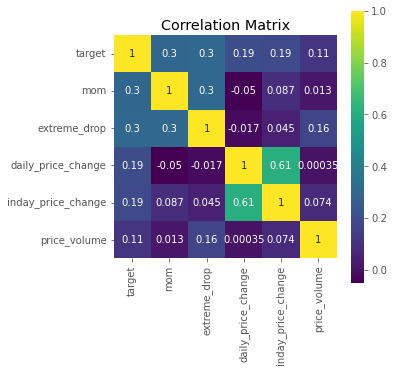

In [87]:
plt.figure(figsize=(5,5))
plt.title("Correlation Matrix")
sns.heatmap(dataset.corr(), vmax = 1, square = True,annot = True,cmap = "viridis")

### Scaling

In [88]:
Y = dataset.dropna().loc[:,Y.name]
X = dataset.dropna().loc[:,X.columns]

In [89]:
scaler = StandardScaler().fit(X.iloc[:,2:]) 
scaled_data = pd.DataFrame(scaler.fit_transform(X.iloc[:,2:]),
                          columns = X.iloc[:,2:].columns,
                          index = X.iloc[:,2:].index) 
X = pd.concat([X.iloc[:,:2],scaled_data],axis=1)

### Train and Test Split

In [90]:
prop = int(len(scaled_data) * 0.80) # train set size
X_Train = X[:prop]
X_Test = X[prop:]
Y_Train =Y[:prop]
Y_Test = Y[prop:]

### Model Selection

In [91]:
models = []
models.append(("GPC", GaussianProcessClassifier()))
models.append(("SGDC", SGDClassifier()))
models.append(("CART", DecisionTreeClassifier()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("SVC", SVC()))
models.append(("ETC", ExtraTreesClassifier()))
models.append(("RFC", RandomForestClassifier()))
models.append(("GBC", GradientBoostingClassifier()))
models.append(("ABC", AdaBoostClassifier()))

In [92]:
names = []
train_results = []
test_results = []
for name, model in models:
    names.append(name)

    # Entire training period
    res = model.fit(X_Train, Y_Train)
    y_train_pd = model.predict(X_Train)
    accuracy_train = metrics.accuracy_score( Y_Train, y_train_pd)
    train_results.append(accuracy_train)
    
    # Results for test
    y_test_pd = model.predict(X_Test)
    accuracy_test = metrics.accuracy_score(Y_Test, y_test_pd)
    test_results.append(accuracy_test)
    
    message = "%s:  train accuracy: %f test accuracy:%f" % (name, accuracy_train,accuracy_test)
    print(message)

GPC:  train accuracy: 0.858264 test accuracy:0.886102
SGDC:  train accuracy: 0.792103 test accuracy:0.877743
CART:  train accuracy: 1.000000 test accuracy:0.343783
KNN:  train accuracy: 0.880230 test accuracy:0.867294
SVC:  train accuracy: 0.837605 test accuracy:0.866249
ETC:  train accuracy: 1.000000 test accuracy:0.770115
RFC:  train accuracy: 1.000000 test accuracy:0.612330
GBC:  train accuracy: 0.884414 test accuracy:0.288401
ABC:  train accuracy: 0.865324 test accuracy:0.843260


According the accuracy result, AdaBoostClassifier seems to be sensable.

### Hypertuning

In [93]:
learning_rates= np.arange(0.1,1,0.1)
for r in learning_rates:
    model = AdaBoostClassifier(n_estimators=100, random_state=0,learning_rate=r)
    res = model.fit(X_Train, Y_Train)

    y_train_pd = model.predict(X_Train)
    accuracy_train = metrics.accuracy_score( Y_Train, y_train_pd)

    y_test_pd = model.predict(X_Test)
    accuracy_test = metrics.accuracy_score(Y_Test, y_test_pd)

    message = "Learning rate %f:  train accuracy: %f test accuracy:%f" % (r, accuracy_train,accuracy_test)
    print(message)

Learning rate 0.100000:  train accuracy: 0.853295 test accuracy:0.874608
Learning rate 0.200000:  train accuracy: 0.861925 test accuracy:0.870428
Learning rate 0.300000:  train accuracy: 0.861663 test accuracy:0.789969
Learning rate 0.400000:  train accuracy: 0.864017 test accuracy:0.791014
Learning rate 0.500000:  train accuracy: 0.860356 test accuracy:0.794148
Learning rate 0.600000:  train accuracy: 0.861140 test accuracy:0.784744
Learning rate 0.700000:  train accuracy: 0.865324 test accuracy:0.684431
Learning rate 0.800000:  train accuracy: 0.866632 test accuracy:0.658307
Learning rate 0.900000:  train accuracy: 0.868201 test accuracy:0.655172


Choose 0.3 as learning rate

### Prediction

In [94]:
model = AdaBoostClassifier(n_estimators=100, random_state=0,learning_rate=0.3).fit(X_Train, Y_Train)
ML2['prediction'] = model.predict(dataset.loc[:,X.columns])

### Result

In [95]:
ML2['returns'] = np.log(ML2['Adj Close']/ML2['Adj Close'].shift(1))
ML2.fillna(0,inplace=True)
ML2['stragety'] = ML2['returns'] * ML2['prediction']
ML2['cum_returns'] =ML2['stragety'].cumsum().apply(np.exp)
ML2_total = ML2['cum_returns']*capital

In [96]:
print("The Sharpe Ratio is {:.4f}".format(sharpe_ratio(ML2['stragety'])))
print("The compound annual growth rate is {:.4f}%".format(CAGR(ML2_total)*100))
print("The maximum drawdown rate is {:.4f}%".format(max_drowdown(ML2_total)*100))
print("{:.4f} is left on your account".format(ML2_total[-1]))

The Sharpe Ratio is 1.5538
The compound annual growth rate is 29.6559%
The maximum drawdown rate is 24.4964%
69454552.8303 is left on your account


In [97]:
fig = [go.Scatter(x = ML2_total.cummax().index, y =ML2_total.cummax().values, name = "Max Capital"),
                   go.Scatter(x = ML2_total.index, y = ML2_total.values, name = "Total Capital")]
layout = dict(title='Our Account',showlegend= True)
f = dict(data = fig,layout = layout)
go.Figure(f)